In [9]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import pandas as pd
import os
import yaml

from matplotlib import offsetbox
from sklearn import manifold, datasets, decomposition, discriminant_analysis
from matplotlib import pyplot as plt 
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec
from random import randint
from mpl_toolkits.mplot3d import Axes3D
from fcmeans import FCM

from evaluation_funcs import performance_accumulation_pixel
from evaluation_funcs import performance_evaluation_pixel
from bbox_iou import bbox_iou
from extract_features import extract_features
from compute_mask import compute_mask
from compute_mask_old import compute_mask_old
from text_removal_mask import text_removal_mask
from text_removal_mask2 import find_text
from search_queries import search
from compute_lbp import compute_lbp
from compute_hog import compute_hog
from compute_dct import compute_dct
from get_text import get_text
from compute_SIFT import compute_SIFT
from compute_SURF import compute_SURF
from search_matches import search_matches_FLANN
from search_matches import search_matches_BF

import tamura
import colorgram
import pywt
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt


## PARAMETERS ##
NBINS = 32        # Number of bins (from 0 to 255)
DIVISIONS = 2     # Number of divisions per dimension [2,4,8,...]
COLORSPACE = cv.COLOR_BGR2HSV

def embedding_plot(X, title):
    x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure()
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(X[:,0], X[:,1], lw=0, s=40) # c=y/10.
    
    plt.xticks([]), plt.yticks([])
    plt.title(title)

print('Done')

Done


In [53]:
def art_features(img, image_name, n_it):
    
    img = cv.resize(img, (round(img.shape[1]/4),round(img.shape[0]/4)))
    #img = cv.resize(img, (512,512))
    img_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    height = img.shape[0]
    width = img.shape[1]
    npx = height*width
    
    #Mean saturation and brightness
    saturation = np.sum(img_hsv[:][:][1])/npx
    brightness = np.sum(img_hsv[:][:][2])/npx

    #Pleasure, arousal and dominance
    pleasure = 0.69*brightness +0.22*saturation 
    arousal = -0.31*brightness +0.60*saturation 
    dominance = 0.76*brightness +0.32*saturation

    #Mean hue and dispersion, with and without saturation
    a = 0
    a_s = 0
    b = 0
    b_s = 0
    for x in range(height):
        for y in range(width):
            a += math.cos(img_hsv[x][y][0])
            a_s += img_hsv[x][y][1]* math.cos(img_hsv[x][y][0])
            b += math.sin(img_hsv[x][y][1])
            b_s += img_hsv[x][y][1] * math.sin(img_hsv[x][y][0])
    
    mean_hue = math.atan2(b,a)
    hue_variance = 1 - math.sqrt(a*a+b*b)/npx
    mean_hue_saturation = math.atan2(b_s,a_s)
    hue_variance_saturation = 1 - math.sqrt(a_s*a_s+b_s*b_s)/(saturation*npx)

    #Colorfulness
    img_signature = np.zeros((64,4), np.float32)
    uniform_signature = np.zeros((64,4), np.float32)
    hist = cv.calcHist([img], [0, 1, 2], None, [4, 4, 4], [0, 255, 0, 255, 0, 255])/npx 
    i=0
    for x in range(0,4):
        for y in range(0,4):
            for z in range(0,4):
                img_signature[i][0] = hist[x][y][z]
                uniform_signature[i][0] = 1/64
                img_signature[i][1] = x
                uniform_signature[i][1] = x
                img_signature[i][2] = y
                uniform_signature[i][2] = y
                img_signature[i][3] = z
                uniform_signature[i][3] = z
                i+=1
    
    colorfulness = cv.EMD(uniform_signature, img_signature, cv.DIST_L2)[0]

    if n_it == 67 :
        vect = [saturation, brightness, pleasure, arousal, dominance, mean_hue, hue_variance, mean_hue_saturation, hue_variance_saturation, colorfulness]
        vect += [0,0,0,0,0,0,0,0,0,0,0,0]
        vect += [0, 0, 0]
        vect += [0, 0, 0]
        print(vect)
        return vect
        
    
    #Main colours
    main_colors = []
    colors = colorgram.extract(image_name, 3)

    for i in range(0,3):
        for j in range(0,3):
            main_colors.append(colors[i].hsl[j])    
        main_colors.append(colors[i].proportion)


    #Tamura texture features: coarseness, contrast and directionality
    coarseness = tamura.coarseness(img_gray, 3)
    contrast = tamura.contrast(img_gray)
    directionality = tamura.directionality(img_gray)

    #Wavelet texture descriptors
    wavelets = []
    coeffs_h= pywt.wavedec2(img_hsv[:][:][0], 'db1', level=3)
    coeffs_s= pywt.wavedec2(img_hsv[:][:][1], 'db1', level=3)
    coeffs_v= pywt.wavedec2(img_hsv[:][:][2], 'db1', level=3)
    for i in range(1,4):
        sum_h = 0
        sum_s = 0
        sum_v = 0
        mod_h = 0
        mod_s = 0
        mod_v = 0
        for j in range(0,3):
            sum_h += np.sum(coeffs_h[i][j])
            sum_s += np.sum(coeffs_s[i][j])
            sum_v += np.sum(coeffs_v[i][j])
            mod_h += math.sqrt(np.sum(coeffs_h[i][j][1]**2))
            mod_s += math.sqrt(np.sum(coeffs_s[i][j][1]**2))
            mod_v += math.sqrt(np.sum(coeffs_v[i][j][1]**2))
        wavelets.append(sum_h/mod_h)
        wavelets.append(sum_s/mod_s)
        wavelets.append(sum_v/mod_v)
    
    #Level of detail (number of regions after segmentation)
    segments_fz1 = felzenszwalb(img, scale=100, sigma=0.8, min_size=30)
    segments_fz2 = felzenszwalb(img, scale=300, sigma=0.8, min_size=30)
    segments_fz3 = felzenszwalb(img, scale=500, sigma=0.8, min_size=30)
    
    lod = [len(np.unique(segments_fz1)), len(np.unique(segments_fz2)), len(np.unique(segments_fz3))]

    # plt.imshow(mark_boundaries(img, segments_fz1))
    # plt.waitforbuttonpress()

    #Dynamics and number of lines
    edges = cv.Canny(img_gray,50,100)
    lines = cv.HoughLines(edges,1,np.pi/180,100)
    vert = 0
    horz = 0
    tilt = 0
    if np.any(lines != None):
        for line in lines:
            for rho, theta in line:
                if np.sin(theta) > -0.1 and np.sin(theta) < 0.1:
                    vert += 1
                elif np.sin(theta-np.pi/2.0) > -0.1 and np.sin(theta-np.pi/2.0) < 0.1:
                    horz +=1
                else:
                    tilt +=1
        num_lines = len(lines)
        vert /= num_lines
        horz /= num_lines
        tilt /= num_lines
    else:
        num_lines = 0

  
    dynamics = [num_lines, vert, horz, tilt]


    #Colour features: saturation + brightness + pleasure + arousal + dominance + mean_hue + hue_variance + mean_hue_saturation + hue_variance_saturation + colorfulness + main_colors
    #Texture features: coarseness + contrast + directionality
    #Composition features: lod
    """
    print('color:')
    print([saturation, brightness, pleasure, arousal, dominance, mean_hue, hue_variance, mean_hue_saturation, hue_variance_saturation, colorfulness, main_colors])
    print('texture:')
    print([coarseness, contrast, directionality])
    print('composition:')
    print(lod)
    """
    
    vect = [saturation, brightness, pleasure, arousal, dominance, mean_hue, hue_variance, mean_hue_saturation, hue_variance_saturation, colorfulness]
    vect += main_colors
    vect += [coarseness, contrast, directionality]
    vect += lod
    print(vect)
    return vect

In [32]:
database = []
i=0
for f in sorted(glob.glob('../database/*.jpg')):
    # Read image
    img = cv.imread(f, cv.IMREAD_COLOR)
    descriptor = art_features(img, f, i)
    database.append(np.hstack(descriptor))
    i += 1
    print(i)

KeyboardInterrupt: 

In [65]:
""" OPCIONAL: LLEGIR LES FEATURES GENERADES PER LA MOBILENET """
database = pickle.load(open('../features.pkl','rb'))
print(np.shape(database))

(279, 20480)


In [71]:
""" OPCIONAL: LLEGIR LES FEATURES DE TEXTURA + COLOR """
database = pickle.load(open('../features_tex_final.pkl','rb'))
print(np.shape(database))

(279, 28)


In [56]:
""" OPCIONAL: LLEGIR LES FEATURES ARTÍSTIQUES PRE-COMPUTADES """
database = pickle.load(open('../features_artistic.pkl','rb'))
print(np.shape(database))

(279, 10)


(28,)
['#625C22', '#ADC9B8', '#94808E', '#FC904E', '#575FD1', '#FCF706', '#2E0526', '#7CC755', '#A70BB9', '#C3E8C9']


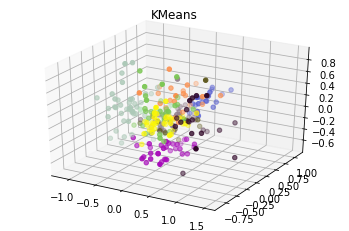

In [76]:
""" PCA """
N_COMPONENTS = 10

# Scatter plot PCA
print(np.shape(descriptor))
db = np.array(database)
n_samples, n_features = db.shape

X_pca = decomposition.PCA(n_components=N_COMPONENTS).fit_transform(db)

# Store results of PCA in a data frame
result=pd.DataFrame(X_pca, columns=['PCA%i' % i for i in range(N_COMPONENTS)])


k=10
k_means = KMeans(init='k-means++', n_clusters=k, n_init=100)
k_means.fit(X_pca)
labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_
k_means_labels_unique = np.unique(labels)

colors = []
for i in range(k):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
print(colors)

# Create a 3D plot independently of the number of components
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for k, col in zip(range(k), colors):
    my_members = labels == k
    cluster_center = k_means_cluster_centers[k]
    ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
plt.title('KMeans')    
plt.grid(True)
plt.show()

['#13320C', '#1AA5A3', '#92EB0A', '#11D99A']


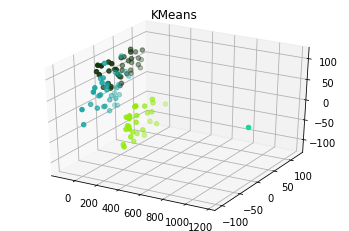

In [48]:
""" PROVA AMB T-SNE """
# Scatter plot t-sne
db = np.array(database)
n_samples, n_features = db.shape

X_tsne = manifold.TSNE(n_components=3, init='pca').fit_transform(db)
result=pd.DataFrame(X_tsne, columns=['PCA%i' % i for i in range(3)])

k_means = KMeans(init='k-means++', n_clusters=10, n_init=200)
k_means.fit(X_tsne)
labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_
k_means_labels_unique = np.unique(labels)

colors = []
for i in range(k):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
print(colors)
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for k, col in zip(range(k), colors):
    my_members = labels == k
    cluster_center = k_means_cluster_centers[k]
    ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
plt.title('KMeans')    
plt.grid(True)
plt.show()

Room 1


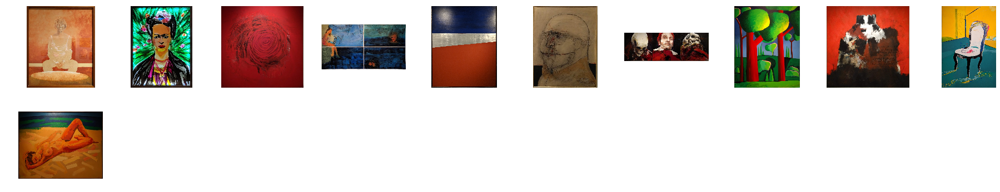

Room 2


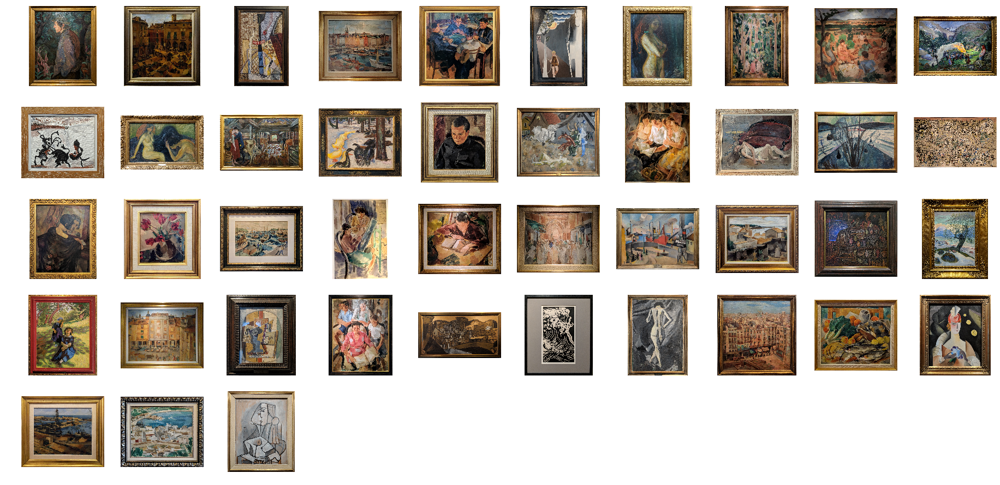

Room 3


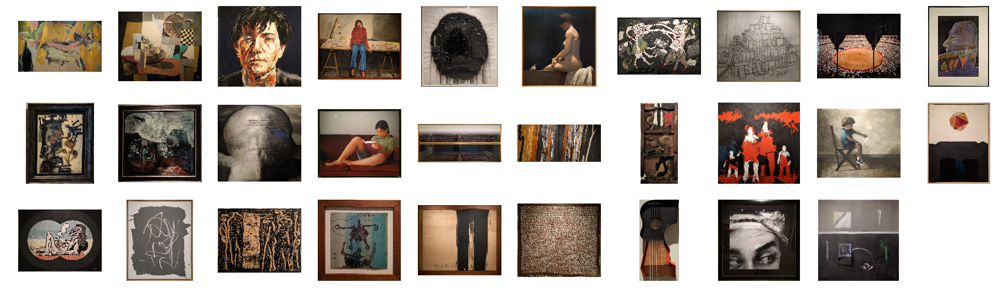

Room 4


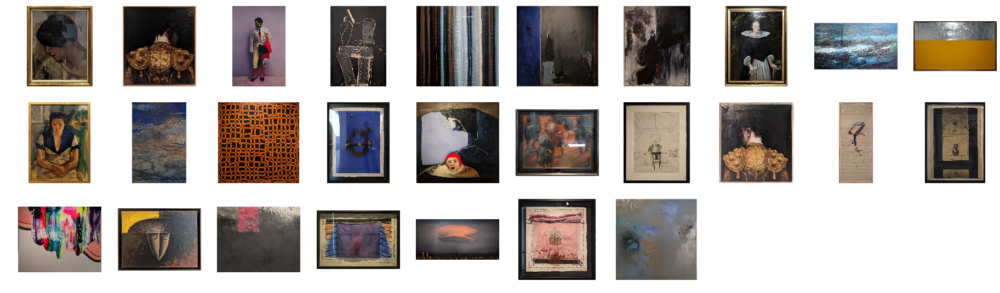

Room 5


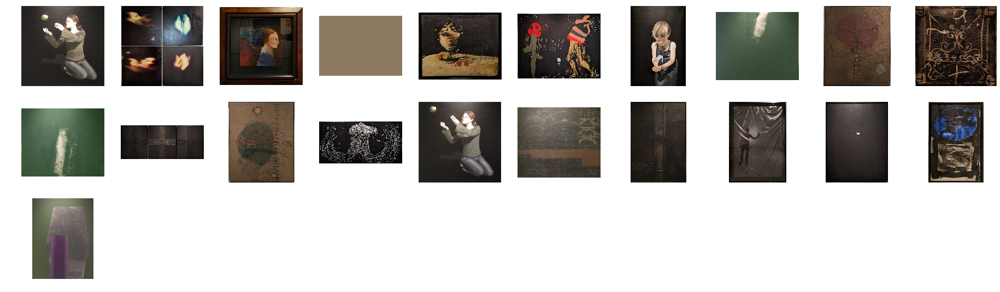

Room 6


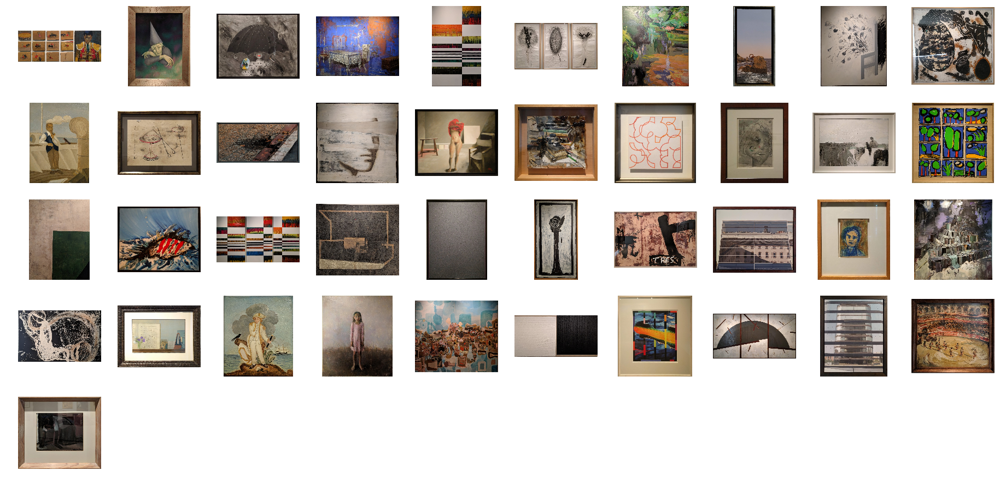

Room 7


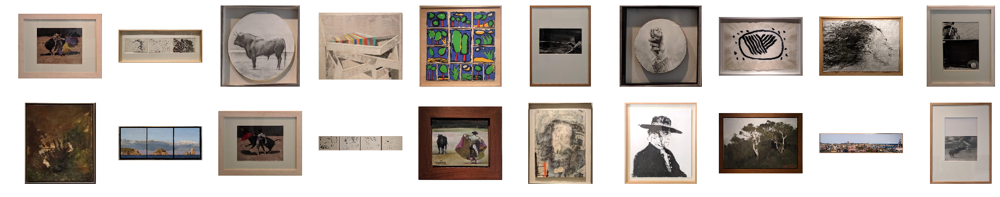

Room 8


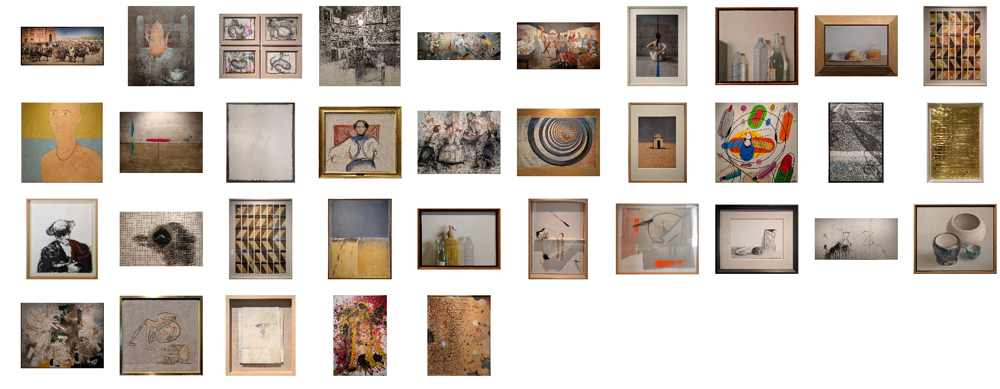

Room 9


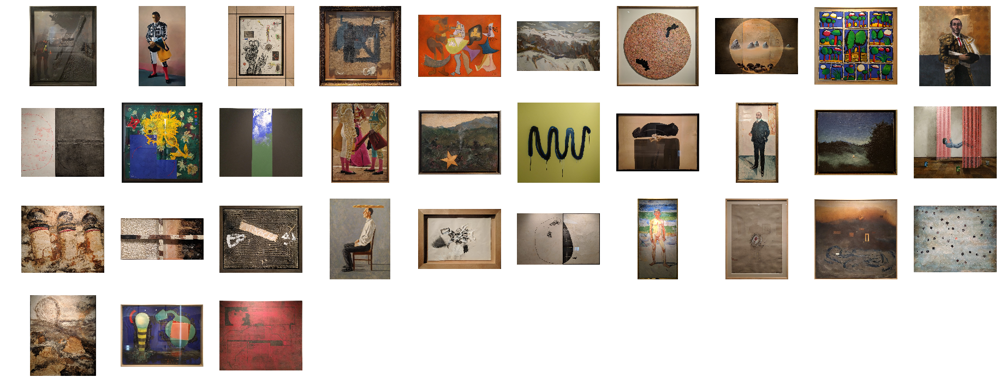

Room 10


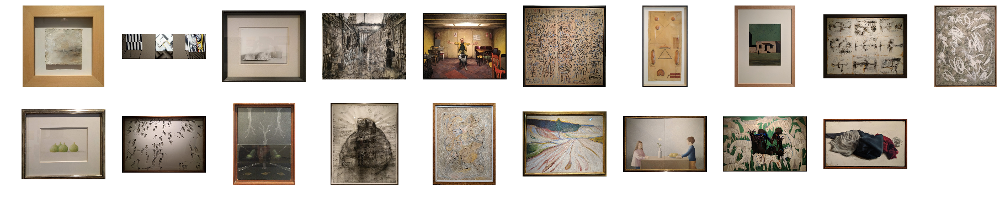

In [77]:
""" PLOT DE LES IMATGES DESIGNADES PER LABELS """
for k in range(10):
    my_members = labels == k
    print('Room ' + str(k+1))
    plt.figure(figsize=(32,32))

    i=0
    n=0
    for f in sorted(glob.glob('../database/*.jpg')):
        if my_members[i] == True :
            img = cv.imread(f, cv.IMREAD_COLOR)
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            ax = plt.subplot(10,10,n+1)
            plt.imshow(img)
            plt.axis('off')
            n += 1
        i+=1
    plt.show()
plt.show()

In [73]:

for i in range(np.shape(database)[1]): # N featues
    f=[]
    for j in range(len(database)):
        f.append(database[j][i])
    maxval = np.max(f)
    minval = np.min(f)
    for j in range(len(database)):
        database[j][i] -= minval
        database[j][i] /= (maxval - minval)
        
